In [1]:
import pandas as pd
import numpy as np
import sklearn 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.metrics import mean_squared_error


# Praca domowa 1
Krzysztof Wolny \
Wstep do uczenia maszynowego - semestr letni 2021\
Eksploracja zbioru danych ze strony: https://www.apispreadsheets.com/datasets/129

## Początkowe przejrzenie danych

In [2]:
# wczytujemy atrybuty badanej bazy danych
atributes_df = pd.read_csv('attributes_forest_fires.csv')

# wyswietlamy zawartość
pd.set_option('max_colwidth',100) #ustawiamy większą szerokość tabeli
atributes_df

,name,type,description
0,X,integer,x-axis spatial coordinate within the Montesinho park map: 1 to 9
1,Y,integer,y-axis spatial coordinate within the Montesinho park map: 2 to 9
2,month,string,month of the year: 'jan' to 'dec'
3,day,string,day of the week: 'mon' to 'sun'
4,FFMC,float,FFMC index from the FWI system: 18.7 to 96.20
5,DMC,float,DMC index from the FWI system: 1.1 to 291.3
6,DC,float,DC index from the FWI system: 7.9 to 860.6
7,ISI,float,ISI index from the FWI system: 0.0 to 56.10
8,temp,float,temperature in Celsius degrees: 2.2 to 33.30
9,RH,float,relative humidity in %: 15.0 to 100


In [3]:
# wczytujemy dane
forest_fires_df = pd.read_csv('forest_fires_dataset.csv')
# patrzymy na pierwsze wyniki
pd.reset_option('^display.', silent=True)#resetujemy wcześniejsze ustawienia
forest_fires_df.head()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,0.0
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,0.0
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,0.0
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,0.0
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,0.0


Widzimy, że mamy dużo danych liczbowych. W zmiennych area i rain widzimy dużo zer co może skazywać na rozkład wykładniczy. 

In [4]:
# przyjżyjmy się danym bliżej
forest_fires_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    float64
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(9), int64(2), object(2)
memory usage: 52.6+ KB


Dane są pełne i nie posiadają żadnych null-i. 

In [5]:
forest_fires_df.describe()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292
std,2.313778,1.229900,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818
min,1.000000,2.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000
25%,3.000000,4.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000
50%,4.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000
75%,7.000000,5.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000
max,9.000000,9.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000


W zmiennej area widzimy, że rzeczywiście mamy bardzo dużo zer, bo co najmniej 25% wyników. Wartości rosną wolno, ale dochodza do dużych liczb, bo aż do powyżej 1000. Podobne cechy widzimy w zmiennej rain. Powyżej 75% wartości są zerami, ale największa wartość wynosi 6.4. 

## Rokłady zmiennych

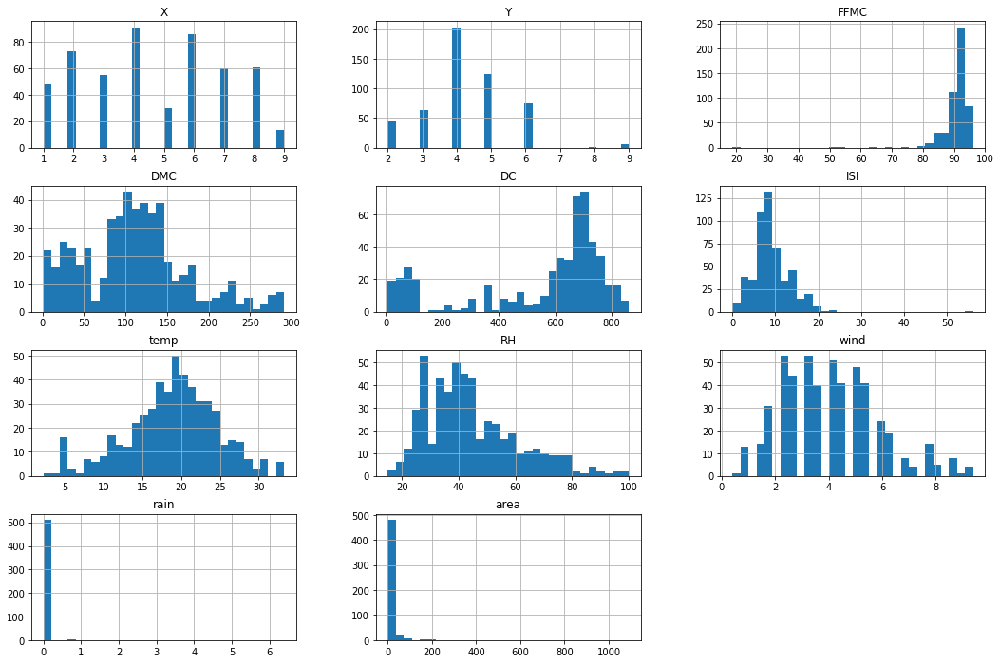

In [6]:
forest_fires_df.hist(figsize=(18, 12), bins=30)
plt.show()

Znowu patrząc na zmienne rain i area potwierdzają się przypuszczenia, że te zmienne mają rozkład wykładniczy. \
Pozostałe zmienne mają rozkład normalny skośny. 


## Korelacje z zmienną area

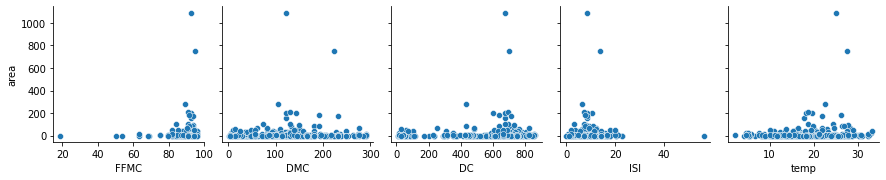

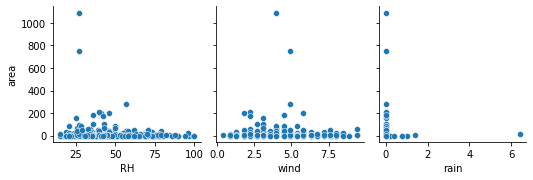

In [7]:
# scatterploty przedstawiające zależność między czynnikiem area i innymi zmiennymi. 
sns.pairplot(forest_fires_df, y_vars="area", x_vars=forest_fires_df.columns.values[4:9])
sns.pairplot(forest_fires_df, y_vars=forest_fires_df.columns.values[-1], x_vars=forest_fires_df.columns.values[9:12])

plt.show()

Przedstawione wykresy są trochę "puste". Można spróbować przedstawić te wykresy ze skalą logarytmiczną. 

In [8]:
# Przygotowanie zbioru treningowego oraz testowego
X_train, X_test, y_train, y_test = train_test_split(
    forest_fires_df[forest_fires_df.columns.values[:-1]], 
    forest_fires_df[forest_fires_df.columns.values[-1]], 
    test_size=0.33, random_state=22)

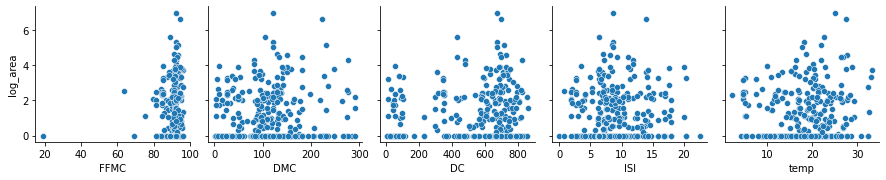

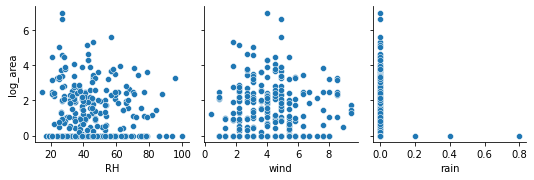

In [9]:
# spróbujmy zrobić wykresy ze skalą logarytmiczną
X_train["log_area"] = np.log1p(y_train)
sns.pairplot(X_train, y_vars="log_area", x_vars=X_train.columns.values[4:9])
sns.pairplot(X_train, y_vars="log_area", x_vars=X_train.columns.values[9:12])

plt.show()

Wykresy ze skalą logarytmiczną wyglądają dużo lepiej i bardziej zapełniją wykres. \
Nie widać jednak żadnych wyraźnych zależności między area i innymi zmiennymi. Jedynie przy wykresie z temperaturą widać delikatną korelację. Możemy się temu przyjrzeć. 

In [10]:
def plot_linear_model(x, y):
    m = LinearRegression()
    m.fit(x.values.reshape(-1, 1), y.values.reshape(-1, 1))
    y_hat = m.predict(x.values.reshape(-1, 1))
    plt.figure(figsize=(8, 5))
    plt.scatter(x, y)
    plt.plot(x, y_hat, c='red')
    plt.show()
    plt.close('all')
    print(f'RMSE: {np.sqrt(mean_squared_error(y, y_hat)):.3f}')

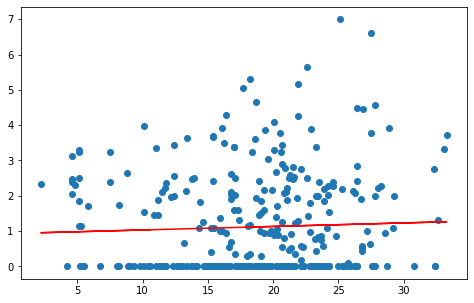

RMSE: 1.409


In [11]:
plot_linear_model(X_train["temp"], np.log1p(y_train))

Nie widać na wykresie wyraźnej zależności liniowej. Przy wzroście temperatury można jednak zauważyć delikatny wzrost zmiennej area.  

## Zależności występowania pożarów z miesiącami

Dalej możemy sprawdzić, w których miesiącach wystepują największe pożary. 

<AxesSubplot:xlabel='month', ylabel='area'>

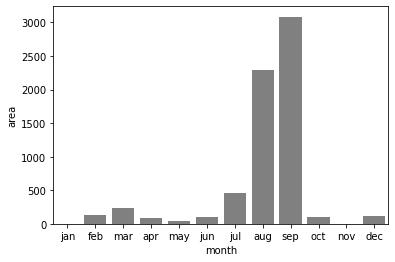

In [12]:
monthly = forest_fires_df.groupby('month')['area'].sum()

Months = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 
             'jul', 'aug', 'sep', 'oct', 'nov', 'dec']
sns.barplot(x = monthly.keys(), y=monthly, order=Months, color='grey')

Z wykresu możemy odczytać, że najwięcej las pali się w okresie letnim. \ 
Występuje również wzrost pożarów na początku wiosny. 

## Pożary, a dni tygodnia

Teraz sprawdźmy jakie są zalżności dni tygodnia ze spaloną powierzchnią lasu. 

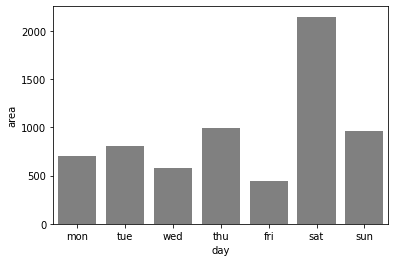

In [13]:
weekly = forest_fires_df.groupby('day')['area'].sum()

days = ["mon", "tue", "wed", "thu", "fri", "sat", "sun"]
sns.barplot(x = weekly.keys(), y=weekly, order=days, color='grey')
plt.show()

Z wykresu wynika, że w soboty najwięcej lasu zostaje spalone. 

## Automatyczna eksploracja danych 

Do automatycznej eksploracji danych użyję pandas-profiling. 

In [14]:
from pandas_profiling import ProfileReport

In [15]:
profile = ProfileReport(forest_fires_df, title="Pandas Profiling Report")

In [16]:
profile

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Ograniczenia narzędzia
Po pierwsze nie można zmienić kolejności wyswietlanych informacji. Zazwyczaj warto zobaczyć na jakich danych się pracuje i przejrzeć kilka pierwszych elementów zanim zacznie się patrzeć na rozkłady. \
Oprócz tego w analizie pojawia nam się mnóstwo zbędnych informacji, co sprawia, że ciężko jest odnaleźć wartościowe informacje. 